<a href="https://colab.research.google.com/github/DommiiUdomp/Well/blob/main/HungaryMap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
from PIL import Image
from scipy import optimize
import matplotlib.pyplot as plt
from IPython.display import Image

%matplotlib inline

# ***EE Map***

In [ ]:
import ee

# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize()

In [50]:
#test API # Print the elevation of Mount Everest.
elv = ee.Image('USGS/SRTMGL1_003')
xy = ee.Geometry.Point([86.9250, 27.9881])
elev = elv.sample(xy, 30).first().get('elevation').getInfo()
print('Mount Everest elevation (m):', elev)

Mount Everest elevation (m): 8729


In [19]:
# Define the urban location of interest as a point near Budapest, Hungary.
u_lon = 19.04
u_lat = 47.4979
u_poi = ee.Geometry.Point(u_lon, u_lat)

# Define the rural location of interest as a point away from the city Szeged.
r_lon = 20.1414
r_lat = 46.2530
r_poi = ee.Geometry.Point(r_lon, r_lat)

# Print the elevation points .
bu_point = elv.sample(u_poi, 30).first().get('elevation').getInfo()
sz_point = elv.sample(r_poi, 30).first().get('elevation').getInfo()
print(f'Budapest point is: {bu_point} and Szeged point is: {sz_point}')

Budapest point is: 119 and Szeged point is: 83


In [20]:
#Get a static map

# Define a region of interest with a buffer zone of 500 km around Hungary.
roi = u_poi.buffer(500000)

# Get a feature collection of administrative boundaries.
countries = ee.FeatureCollection('FAO/GAUL/2015/level0').select('ADM0_NAME')

# Filter the feature collection to subset Hungary.
hungary = countries.filter(ee.Filter.eq('ADM0_NAME', 'Hungary'))

# Make pixels with elevation below sea level transparent.
elv_img = elv.updateMask(elv.gt(0))

In [22]:
# Create a buffer zone of 250 km around Budapest.
bu = u_poi.buffer(250000)  # meters

# Clip the image by Hungary.
elv_hu = elv_img.clip(hungary)

# Create the URL associated with the styled image data.
url_elv = elv_hu.getThumbUrl({ 'min': 0, 'max': 1000, 'region': bu, 'dimensions': 1000,
                              'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5']})

# Display a thumbnail of elevation in Hungary.
Image(url=url_elv)

In [34]:
#Budapest #west, south, east, north = (18.847365, 47.347053, 19.358229, 47.655069)
node1 = [18.847365, 47.347053]
node2 = [19.358229, 47.347053]
node3 = [18.847365, 47.655069]
node4 = [19.358229, 47.655069]

nodes = [node1, node2, node3, node4]

# make points from nodes
points = [ee.Geometry.Point(coord) for coord in nodes]

# make features from points (name by list order)
feats = [ee.Feature(p, {'name': 'node{}'.format(i)}) for i, p in enumerate(points)]

# make a featurecollection from points
fc = ee.FeatureCollection(feats)

# extract points from DEM
reducer = ee.Reducer.first()
data = elv.reduceRegions(fc, reducer.setOutputs(['elevation']), 30)

# see data
for feat in data.getInfo()['features']:
    print(feat['properties'])

# export as CSV
task = ee.batch.Export.table.toDrive(data, 'pointsDataExtract', 'FOLDER', 'nameOfCSV')
task.start()

{'elevation': 123, 'name': 'node0'}
{'elevation': 117, 'name': 'node1'}
{'elevation': 349, 'name': 'node2'}
{'elevation': 195, 'name': 'node3'}


In [73]:
slope = ee.Terrain.slope(elv_hu)
topo = ee.Image.cat(elv_hu, slope)
topoCol = ee.ImageCollection([topo])

# ***Folium map***

In [ ]:
!pip install rasterstats

In [ ]:
# Import the Folium library.
import folium

# Define a method for displaying Earth Engine image tiles to folium map.
def add_ee_layer(self, ee_image_object, vis_params, name):
  map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
  folium.raster_layers.TileLayer(
    tiles = map_id_dict['tile_fetcher'].url_format,
    attr = 'Map Data &copy; <a href="https://earthengine.google.com/">Google Earth Engine</a>',
    name = name,
    overlay = True,
    control = True
  ).add_to(self)

# Add EE drawing method to folium.
folium.Map.add_ee_layer = add_ee_layer

# Set visualization parameters.
vis_params = {
  'min': 0,
  'max': 1000,
  'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5']}

# Create a folium map object.
map = folium.Map(location=(u_lat,u_lon), zoom_start=7, height=500)

# Add the elevation model to the map object.
map.add_ee_layer(elv_hu.updateMask(elv_hu.gt(0)), vis_params, 'DEM')

# Add a layer control panel to the map.
map.add_child(folium.LayerControl())

# Display the map.
display(map)

# ***contextily***

In [ ]:
!pip install contextily

In [37]:
import contextily
from contextily import Place

In [ ]:
contextily.providers.keys()

dict_keys(['OpenStreetMap', 'OpenSeaMap', 'OPNVKarte', 'OpenTopoMap', 'OpenRailwayMap', 'OpenFireMap', 'SafeCast', 'Stadia', 'Thunderforest', 'CyclOSM', 'Hydda', 'Jawg', 'MapBox', 'MapTiler', 'Stamen', 'TomTom', 'Esri', 'OpenWeatherMap', 'HERE', 'HEREv3', 'FreeMapSK', 'MtbMap', 'CartoDB', 'HikeBike', 'BasemapAT', 'nlmaps', 'NASAGIBS', 'NLS', 'JusticeMap', 'GeoportailFrance', 'OneMapSG', 'USGS', 'WaymarkedTrails', 'OpenAIP', 'OpenSnowMap', 'AzureMaps', 'SwissFederalGeoportal', 'Gaode', 'Strava'])

In [ ]:
src = elv_hu.getMapId(vis_params)["tile_fetcher"].url_format
hu = contextily.Place("Hungary", source=src)

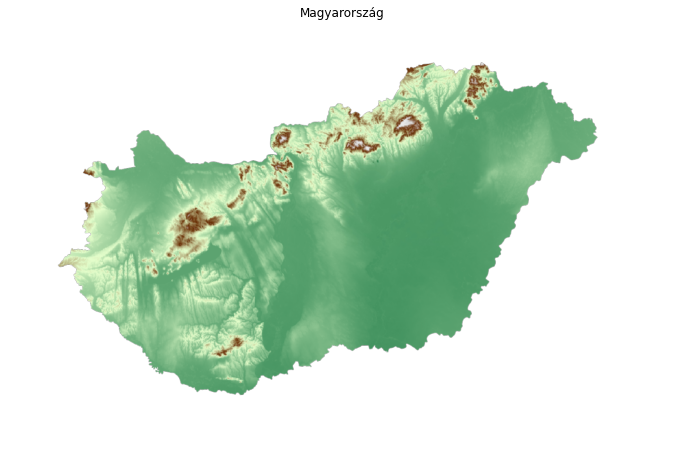

In [ ]:
hu.plot()

In [ ]:
!pip install --upgrade -q pyproj

     |████████████████████████████████| 6.3 MB 5.1 MB/s 


In [ ]:
from pyproj import Proj

In [ ]:
#WGS 84 / UTM zone 34N
p = Proj(proj='utm',zone=33&34,ellps='WGS84', preserve_units=False)
x,y = p(21, 47)
x,y

(1411804.9603304795, 5275495.418990009)

(1024, 1536, 4)
(1721973.3732084506, 2661231.5767766964, 5635549.221409473, 6261721.35712164)


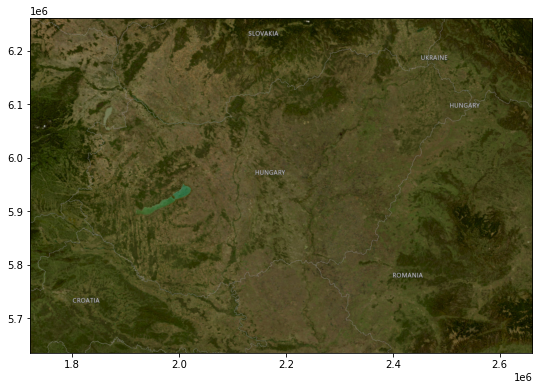

In [ ]:
#Budapest #west, south, east, north = (18.847365, 47.347053, 19.358229, 47.655069)
#Hungary
west, south, east, north = (15.910198,45.592868,  23.249065,48.873718, )
hu_img, hu_ext = contextily.bounds2img(west,south,east,north,ll=True,source=contextily.providers.USGS.USImageryTopo)#.providers.Stamen.Toner)
print(hu_img.shape)
print(hu_ext)

fig, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(hu_img, extent=hu_ext)

fig.show()

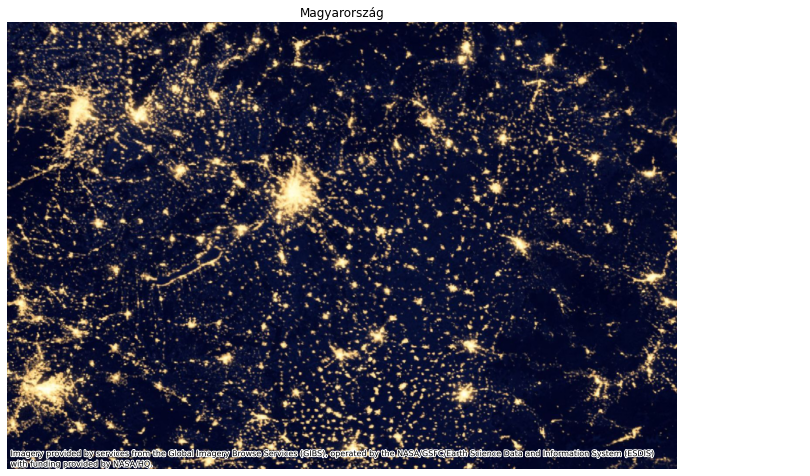

In [ ]:
hu_night = contextily.Place("Hungary", source=contextily.providers.NASAGIBS.ViirsEarthAtNight2012)
hu_night.plot()

In [ ]:
%time budapest_hu = contextily.Place("Budapest, HU")

CPU times: user 50.3 ms, sys: 16 ms, total: 66.3 ms
Wall time: 440 ms


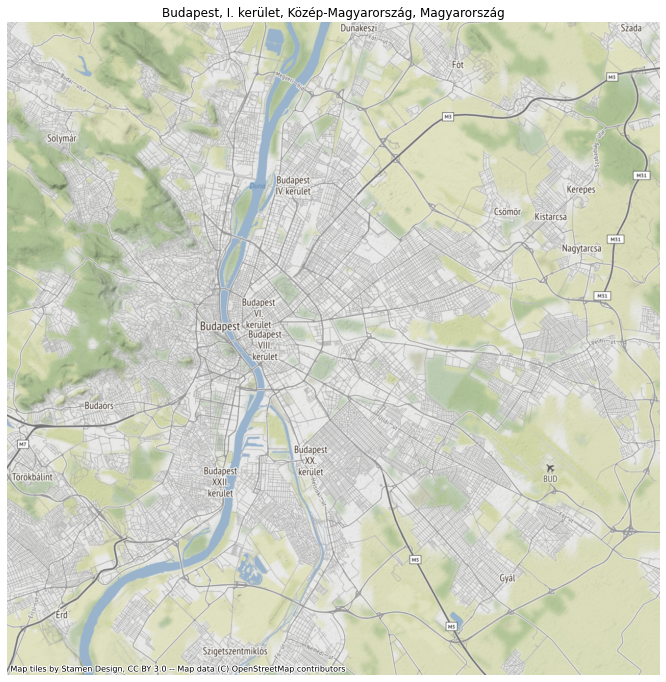

In [ ]:
budapest_hu.plot()

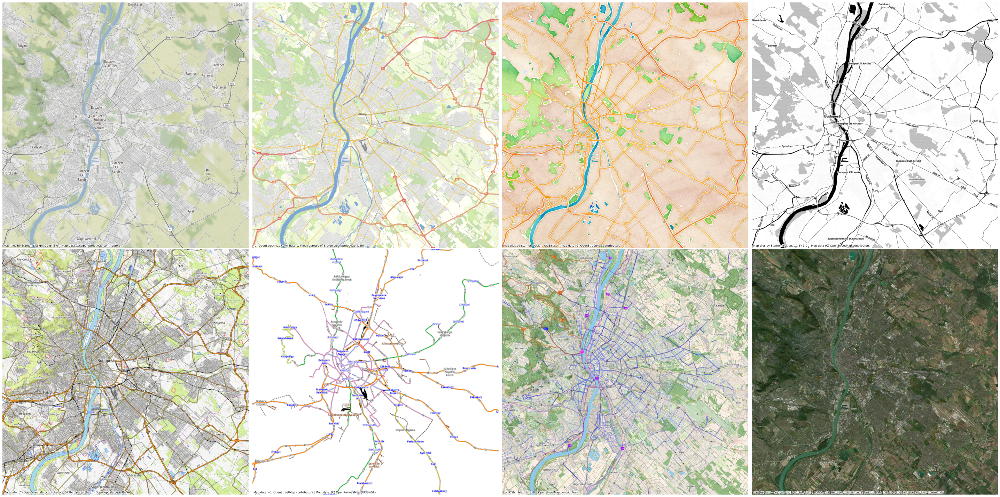

In [104]:
fig, axs = plt.subplots(2,4, figsize=(40,20))
for i, source in enumerate([contextily.providers.Stamen.Terrain,
                            contextily.providers.OpenStreetMap.BZH,
                            contextily.providers.Stamen.Watercolor,
                            contextily.providers.Stamen.Toner,
                            contextily.providers.OpenTopoMap(),
                            contextily.providers.OpenRailwayMap(),
                            contextily.providers.CyclOSM(),
                            contextily.providers.Esri.WorldImagery
                            ]):
    ax = Place("Budapest", source=source).plot(ax=axs.flatten()[i])
    ax.axis("off")
    plt.tight_layout()

# ***Raster***

In [ ]:
!pip install rasterio

In [39]:
import rasterio
from rasterio.plot import show as rioshow
from shapely.geometry import box
from rasterio.plot import show_hist

In [92]:
hu = contextily.Place("Hungary",path="/content/hu.tif")

In [105]:
budapest_hu = contextily.Place("Budapest, HU", path="/content/budapest_hu.tif")

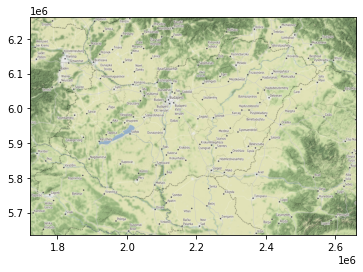

In [106]:
with rasterio.open("/content/hu.tif") as r:
    rioshow(r)
#OR plt.imshow(szeged_hu.im)

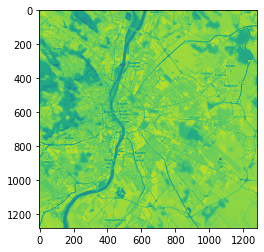

In [107]:
budapest_rs = rasterio.open("/content/budapest_hu.tif")
plt.imshow(budapest_rs.read(1))

plt.show()

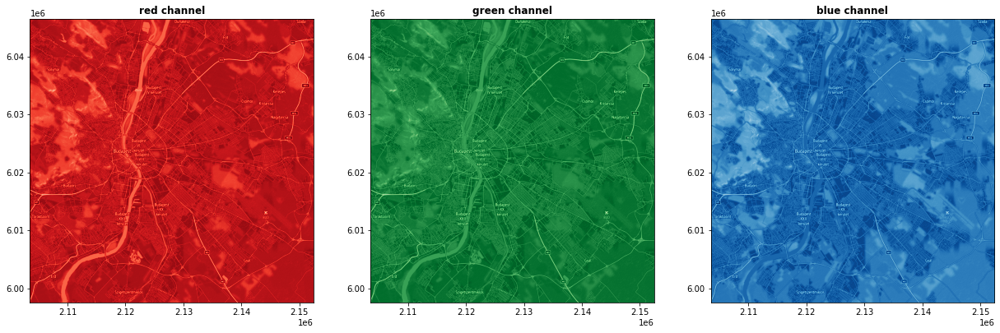

In [108]:
fig, (axr, axg, axb) = plt.subplots(1,3, figsize=(21,7))
rioshow((budapest_rs, 1), ax=axr, cmap='Reds', title='red channel')
rioshow((budapest_rs, 2), ax=axg, cmap='Greens', title='green channel')
rioshow((budapest_rs, 3), ax=axb, cmap='Blues', title='blue channel')
plt.show()

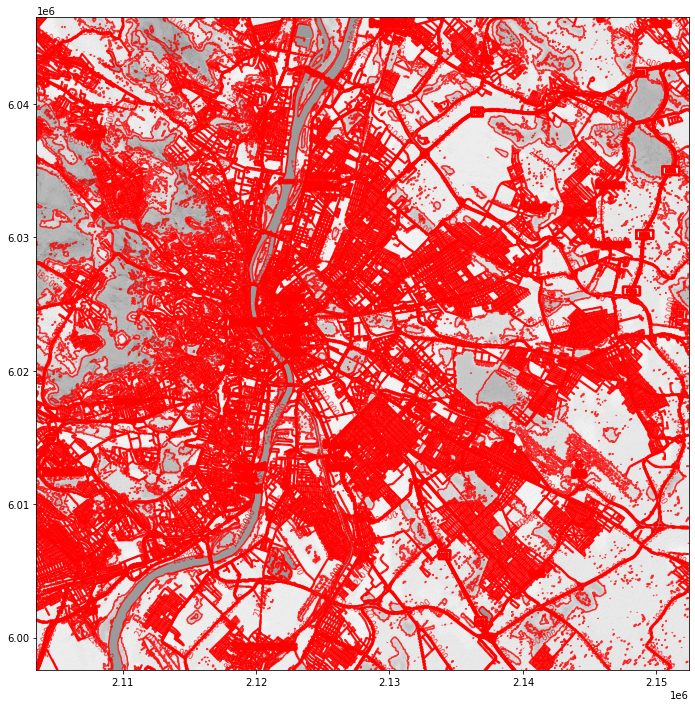

In [109]:
fig, ax = plt.subplots(1, figsize=(12, 12))
rioshow((budapest_rs, 1), cmap='Greys_r', interpolation='none', ax=ax)
rioshow((budapest_rs, 1), contour=True, ax=ax)

plt.show()

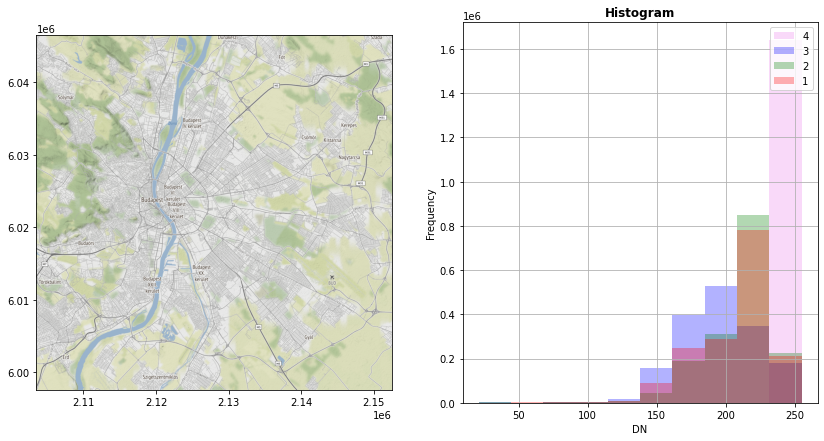

In [112]:
fig, (axrgb, axhist) = plt.subplots(1, 2, figsize=(14,7))
rioshow(budapest_rs, ax=axrgb)
show_hist(budapest_rs, bins=10, histtype='stepfilled', lw=0.0, stacked=False, alpha=0.3, ax=axhist)

plt.show()

In [113]:
budapest_rs.tags()

{'AREA_OR_POINT': 'Area'}

In [115]:
budapest_rs.lnglat()

(19.116039276123043, 47.487629009153814)

In [128]:
budapest_hu.bbox

[18.9251057, 47.3496899, 19.3349258, 47.6131468]

In [123]:
budapest_hu.longitude, budapest_hu.latitude

(19.0403594, 47.4979937)

In [122]:
budapest_rs.crs

CRS.from_epsg(3857)

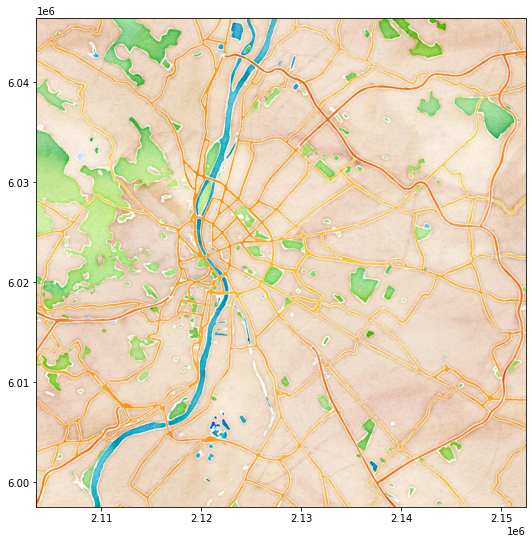

In [126]:
img, ext = contextily.bounds2raster(18.9251057, 47.3496899, 19.3349258, 47.6131468,
                             "/content/budapest_hu.tif",
                             source=contextily.providers.Stamen.Watercolor,
                             ll=True
                            )

fig, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(img, extent=ext)
fig.show()

# ***GEOPANDAS***

In [ ]:
!pip install --upgrade descartes
!pip install --upgrade geoplot

In [ ]:
!pip install geopandas

In [ ]:
!pip install --upgrade pyshp

In [ ]:
!pip install --upgrade shapely

In [100]:
import geopandas as gpd
import geoplot
import mapclassify

In [ ]:
!wget "https://www.eea.europa.eu/data-and-maps/data/eea-reference-grids-2/gis-files/hungary-shapefile/at_download/file/Hungary_shapefile.zip"
!wget 'http://stacks.stanford.edu/file/druid:xg382ws2128/data.zip'

In [ ]:
!unzip "/content/Hungary_shapefile.zip" -d "/content/"
!unzip "/content/data.zip" -d "/content/"

In [101]:
hu = gpd.read_file('/content/hu_1km.shp')
type(hu)

geopandas.geodataframe.GeoDataFrame

In [ ]:
hu.head()

,CELLCODE,EOFORIGIN,NOFORIGIN,geometry
0,1kmE4771N2656,4771000,2656000,"POLYGON ((4771000.000 2656000.000, 4771000.000..."
1,1kmE4771N2657,4771000,2657000,"POLYGON ((4771000.000 2657000.000, 4771000.000..."
2,1kmE4771N2658,4771000,2658000,"POLYGON ((4771000.000 2658000.000, 4771000.000..."
3,1kmE4771N2659,4771000,2659000,"POLYGON ((4771000.000 2659000.000, 4771000.000..."
4,1kmE4771N2660,4771000,2660000,"POLYGON ((4771000.000 2660000.000, 4771000.000..."


In [ ]:
hu.crs

<Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: European Terr

In [130]:
budapest_rs.crs

CRS.from_epsg(3857)

In [131]:
# Project the data Projection EPSG:3035 -- 3857
hu_projected = hu.to_crs({'init': 'epsg:3857'})

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [132]:
hu_projected.geometry[:5]

0    POLYGON ((1770273.582 5918641.004, 1770385.567...
1    POLYGON ((1770385.567 5920101.491, 1770497.601...
2    POLYGON ((1770497.601 5921562.213, 1770609.684...
3    POLYGON ((1770609.684 5923023.170, 1770721.817...
4    POLYGON ((1770721.817 5924484.361, 1770833.998...
Name: geometry, dtype: geometry

In [133]:
hu_projected = hu.to_crs(budapest_rs.crs)
hu_projected.geometry[:5]

0    POLYGON ((1770273.582 5918641.004, 1770385.567...
1    POLYGON ((1770385.567 5920101.491, 1770497.601...
2    POLYGON ((1770497.601 5921562.213, 1770609.684...
3    POLYGON ((1770609.684 5923023.170, 1770721.817...
4    POLYGON ((1770721.817 5924484.361, 1770833.998...
Name: geometry, dtype: geometry

In [134]:
hu_projected.to_file('/content/hu_projected.shp')  

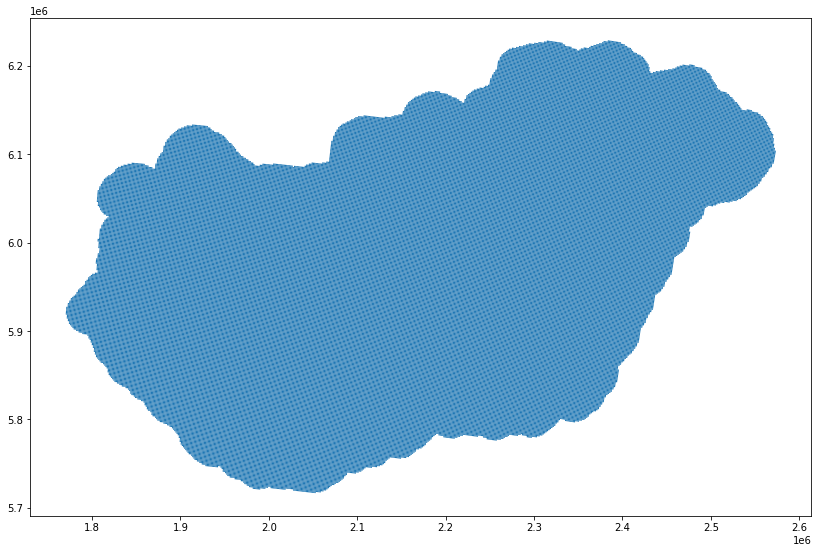

In [138]:
hu_projected.plot(figsize=(14,12))

# ***RasterState***

In [82]:
from rasterstats import zonal_stats

In [ ]:
hungary_rs = zonal_stats("/content/hu_projected.shp", "/content/hu.tif", band=1) 
rioshow(hungary_rs)

In [ ]:
hu_projected.plot(figsize=(14,12))

In [ ]:
bu = gpd.read_file('/content/Budapest_studyarea.shp')
bu.head()

,geometry
0,"POLYGON ((363066.679 5279451.421, 363085.044 5..."


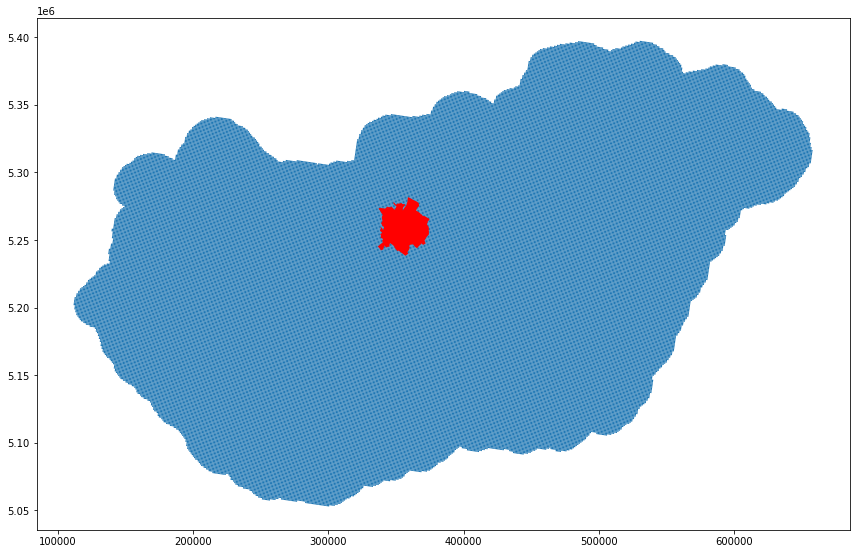

In [ ]:
# Plot overlayed maps
fig, ax = plt.subplots(figsize=(12,12))
hu_projected.plot(ax=ax)
bu.plot(markersize=0.5, color='red',ax=ax)
plt.tight_layout()
#plt.savefig('overlay_map.png')
plt.show()

In [ ]:
# Save projected countries 
shp = '/content/hu_1km_EPSG:32634.shp'
hu_projected.to_file(shp)

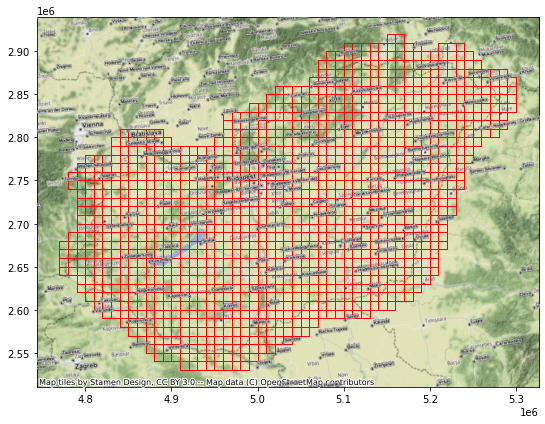

In [ ]:
hu_10km = gpd.read_file('/content/hu_10km.shp')
#hu10_projected = hu_10km.to_crs({'init': 'epsg:32634'})

ax = hu_10km.plot(figsize=(9,9), color="none", edgecolor="r", linewidth=1)
contextily.add_basemap(ax, crs=hu_10km.crs.to_string(), source=contextily.providers.Stamen.Terrain)
contextily.add_basemap(ax, crs=hu_10km.crs.to_string(), source=contextily.providers.Stamen.TonerLabels)

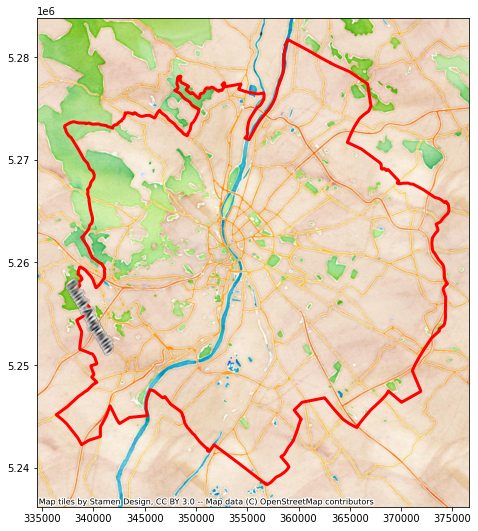

In [ ]:
ax = bu.plot(figsize=(9,9), color="none", edgecolor="r", linewidth=3)
contextily.add_basemap(ax, crs=bu.crs.to_string(), source=contextily.providers.Stamen.Watercolor, zoom=12)
contextily.add_basemap(ax, crs=hu_10km.crs.to_string(), source=contextily.providers.Stamen.TonerLabels,zoom=10)

In [ ]:
!pip install --upgrade geemap

In [ ]:
import geemap

In [ ]:
#aus_streets = aus_streets.to_crs(aus_data.crs)

In [ ]:
# Create a map.
my_map = folium.Map(location=[u_lat, u_lon], zoom_start=10, tiles ='Stamen Terrain') #Budapest
folium.TileLayer('Stamen Watercolor',name="Light Map",control=False).add_to(my_map)
my_map

In [ ]:
!unzip 'https://mapcruzin.com/download-shapefile/hungary-building-shape.zip' -d "/content/"
hu_bd = gpd.read_file('/content/buildings.shp')
hu_bd.head()

unzip:  cannot find or open https://mapcruzin.com/download-shapefile/hungary-building-shape.zip, https://mapcruzin.com/download-shapefile/hungary-building-shape.zip.zip or https://mapcruzin.com/download-shapefile/hungary-building-shape.zip.ZIP.


,osm_id,name,type,geometry
0,8049713,Citadella,castle,"POLYGON ((19.04349 47.48664, 19.04357 47.48708..."
1,10700288,None,castle,"POLYGON ((19.85674 48.17124, 19.85669 48.17146..."
2,11702659,PÃ³lus Center,None,"POLYGON ((19.13840 47.55166, 19.13924 47.55118..."
3,12703482,PuskÃ¡s Ferenc stadion,attraction,"POLYGON ((19.09838 47.50475, 19.09866 47.50473..."
4,23661179,Lidl,store,"POLYGON ((17.46744 45.96261, 17.46747 45.96195..."


Text(0.5, 1.0, 'HU')

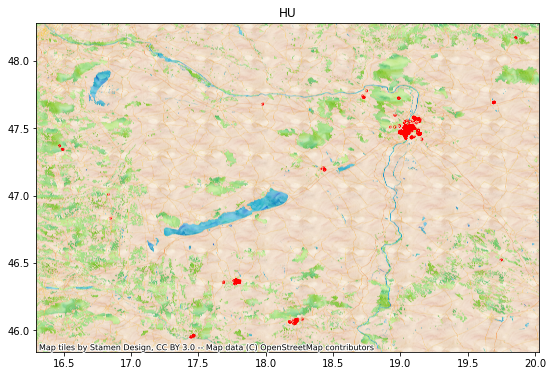

In [ ]:
ax = hu_bd.plot(figsize=(9,9), color="none", edgecolor="r", linewidth=3)
contextily.add_basemap(ax, crs=hu_bd.crs.to_string(), source=contextily.providers.Stamen.Watercolor, zoom=12)
ax.set_title('HU')

In [ ]:
!wget 'https://mapcruzin.com/download-shapefile/hungary-natural-shape.zip'

In [ ]:
!unzip '/content/hungary-natural-shape.zip' -d "/content/"

In [ ]:
hu_natural = gpd.read_file('/content/natural.shp')
hu_natural.head(2)

,osm_id,name,type,geometry
0,3431113,PÃ©csi tÃ³,water,"POLYGON ((18.14078 46.15175, 18.14207 46.14985..."
1,3566966,None,water,"POLYGON ((18.11869 46.17653, 18.11907 46.17718..."


In [ ]:

my_map.add_child(folium.LayerControl())
my_map

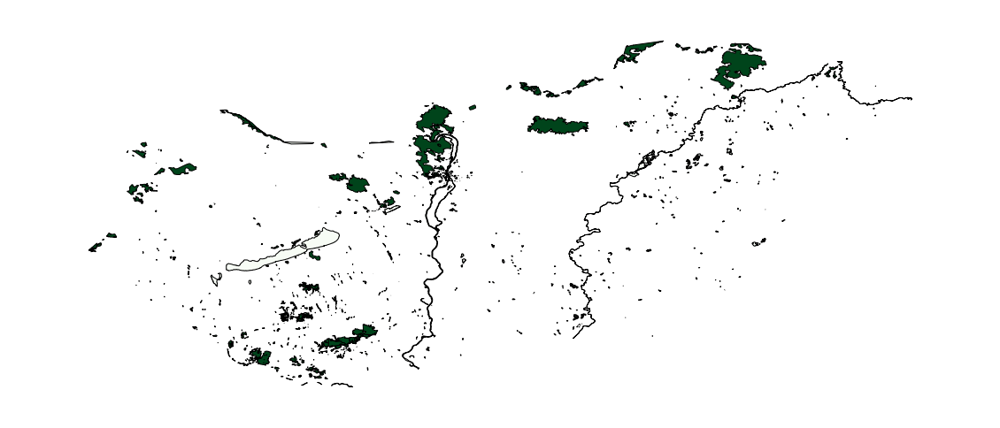

In [ ]:
geoplot.choropleth(hu_natural, hue=hu_natural['type']=='forest',
                   cmap='Greens', figsize=(20,20)
)

In [ ]:
!wget 'https://mapcruzin.com/download-shapefile/hungary-places-shape.zip' 
!unzip '/content/hungary-places-shape.zip' -d "/content/"

In [ ]:
hu_place = gpd.read_file('/content/places.shp')
hu_place.head(2)

,osm_id,name,type,population,geometry
0,15347150,MÃ¡nfa,village,0,POINT (18.24070 46.15839)
1,15350070,Som,village,0,POINT (18.13979 46.80764)


In [ ]:
hu_pop = hu_place[hu_place['population']>0]

In [ ]:
ax = geoplot.kdeplot(hu_pop, shade=True, cmap='Reds', projection=geoplot.crs.AlbersEqualArea())
geoplot.polyplot(hu_pop, ax=ax, zorder=1)

In [ ]:
!wget 'https://mapcruzin.com/download-shapefile/hungary-points-shape.zip'

In [ ]:
!unzip '/content/hungary-points-shape.zip' -d "/content/"

In [ ]:
hu_poi = gpd.read_file('/content/points.shp')
hu_poi.head(2)

,osm_id,name,type,geometry
0,277309,None,traffic_signals,POINT (19.03849 47.51451)
1,15733066,Letenye Ljubljana,motorway_junctio,POINT (16.73687 46.41461)


In [ ]:
!wget 'https://mapcruzin.com/download-shapefile/hungary-railways-shape.zip'
!wget 'https://mapcruzin.com/download-shapefile/hungary-roads-shape.zip'
!wget 'https://mapcruzin.com/download-shapefile/hungary-waterways-shape.zip'

In [ ]:
!unzip '/content/hungary-railways-shape.zip' -d "/content/"
!unzip '/content/hungary-roads-shape.zip' -d "/content/"
!unzip '/content/hungary-waterways-shape.zip' -d "/content/"

In [ ]:
hu_railways = gpd.read_file('/content/railways.shp')
hu_roads = gpd.read_file('/content/roads.shp')
hu_wt = gpd.read_file('/content/waterways.shp')
hu_railways.head(2)

,osm_id,name,type,geometry
0,4292868,None,rail,"LINESTRING (17.99075 46.03301, 17.98490 46.033..."
1,4293011,None,rail,"LINESTRING (18.10460 46.21936, 18.10491 46.217..."
